# data download

https://www.kaggle.com/competitions/kdtai-3/data

# yolov5

In [49]:
# yolo v5
# clone the Yolo v5 git repo to destination directory
!git clone https://github.com/ultralytics/yolov5 ../python_scripts/yolov5

Cloning into '../python_scripts/yolov5'...
remote: Enumerating objects: 15935, done.
remote: Counting objects: 100% (104/104), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 15935 (delta 67), reused 75 (delta 52), pack-reused 15831
Receiving objects: 100% (15935/15935), 14.59 MiB | 15.51 MiB/s, done.
Resolving deltas: 100% (10936/10936), done.


In [ ]:
# use conda if possible
%cd ../python_scripts/yolov5
!pip install -r requirements.txt

# make labels

In [30]:
import os
import pandas as pd
from pathlib import Path

data_path = Path('../data/Animal Detection')
label_path = data_path / 'labels'

if label_path.exists():
  print("label directory already exist.")
else:
  label_path.mkdir(parents=True, exist_ok=True)
  print(f"create label directory: {label_path}")

train_csv_path= Path('../data/Animal Detection/labels') / 'train_output.csv'
test_csv_path= Path('../data/Animal Detection/labels') / 'test_output.csv'

# if already moved , error
!mv ../data/'Animal Detection'/train/train_output.csv ../data/'Animal Detection'/labels/train_output.csv
!mv ../data/'Animal Detection'/test/test_output.csv ../data/'Animal Detection'/labels/test_output.csv

create label directory: ../data/Animal Detection/labels


In [31]:
train_df= pd.read_csv(train_csv_path)
test_df= pd.read_csv(test_csv_path)

train_df.head()

,filename,label
0,1,1 0.438281 0.529551 0.814063 0.704492
1,2,3 0.541016 0.524324 0.849219 0.672973
2,3,2 0.492500 0.517045 0.695000 0.725000
3,4,2 0.585156 0.525000 0.692187 0.785135
4,5,3 0.385547 0.645270 0.614844 0.698649\n3 0.559...


In [32]:
# train_output.csv에서 각 이미지의 annotation파일 생성

if not (label_path / 'train').exists():
    (label_path / 'train').mkdir()

for i in range(len(train_df)):
    title = train_df.iloc[i, 0]
    title = str(title).zfill(4)

    data = train_df.iloc[i, 1]

    file_path = label_path / 'train' / f'{title}.txt'

    with open(file_path, 'w') as file:
        file.write(data)

In [33]:
# test_output.csv에서 각 이미지의 annotation파일 생성

if not (label_path / 'test').exists():
    (label_path / 'test').mkdir()

for i in range(len(test_df)):
    title = test_df.iloc[i, 0]
    title = str(title).zfill(4)

    data = test_df.iloc[i, 1]

    file_path = label_path / 'test' / f'{title}.txt'

    with open(file_path, 'w') as file:
        file.write(data)

# Organize Directories

In [34]:
image_path = data_path / 'images'

if image_path.exists():
  print("image directory already exist.")
else:
  image_path.mkdir(parents=True, exist_ok=True)
  print(f"create image directory: {image_path}")

!mv ../data/'Animal Detection'/train ../data/'Animal Detection'/images/train
!mv ../data/'Animal Detection'/test ../data/'Animal Detection'/images/test

create image directory: ../data/Animal Detection/images


# data split

In [35]:
from glob import glob

train_img_list_all=glob("../data/Animal Detection/images/train/*.jpg")
test_img_list = glob("../data/Animal Detection/images/test/*.jpg")

train_img_list_all[:5], len(train_img_list_all), len(test_img_list)

(['../data/Animal Detection/images/train/0071.jpg',
  '../data/Animal Detection/images/train/0717.jpg',
  '../data/Animal Detection/images/train/0703.jpg',
  '../data/Animal Detection/images/train/0065.jpg',
  '../data/Animal Detection/images/train/0059.jpg'],
 1204,
 300)

In [36]:
import random

random_image_path = random.sample(train_img_list_all, k=1204) # random pick # change!
print(len(random_image_path))

1204


In [37]:
from sklearn.model_selection import train_test_split

train_img_list, val_img_list= train_test_split(random_image_path, test_size= 0.1, random_state= 2000)

print(len(train_img_list), len(val_img_list))

1083 121


In [38]:
with open(data_path / 'train.txt', 'w') as f:
  f.write('\n'.join(train_img_list)+ '\n')

with open(data_path / 'val.txt', 'w') as f:
  f.write('\n'.join(val_img_list)+ '\n')

with open(data_path / 'test.txt', 'w') as f:
  f.write('\n'.join(test_img_list) + '\n')

# create data.yaml

In [39]:
%%writefile '../data/Animal Detection/data.yaml'
# 참고)https://docs.ultralytics.com/yolov5/tutorials/train_custom_data/#11-create-datasetyaml
# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: ../../data/Animal Detection  # dataset root dir
train: images/train  # train images (relative to 'path') 128 images
val: images/test  # val images (relative to 'path') 128 images
test: images/test  # test images (optional)

# Classes 
names:
  0: buffalo
  1: elephant
  2: rhino
  3: zebra

Writing ../data/Animal Detection/data.yaml


In [40]:
import yaml

with open('../data/Animal Detection/data.yaml', 'r') as f:
    data = yaml.load(f, Loader=yaml.SafeLoader)
print(data)

data['train'] = 'train.txt' #
data['val'] = 'val.txt' #

with open('../data/Animal Detection/data.yaml', 'w') as f:
    yaml.dump(data, f)

print(data)

{'path': '../../data/Animal Detection', 'train': 'images/train', 'val': 'images/test', 'test': 'images/test', 'names': {0: 'buffalo', 1: 'elephant', 2: 'rhino', 3: 'zebra'}}
{'path': '../../data/Animal Detection', 'train': 'train.txt', 'val': 'val.txt', 'test': 'images/test', 'names': {0: 'buffalo', 1: 'elephant', 2: 'rhino', 3: 'zebra'}}


In [41]:
with open('../data/Animal Detection/data.yaml', 'r') as f:
  data = yaml.load(f, Loader=yaml.SafeLoader)
print(data)

data['test'] = 'test.txt'

with open('../data/Animal Detection/data.yaml', 'w') as f:
  yaml.dump(data, f)

print(data)

{'names': {0: 'buffalo', 1: 'elephant', 2: 'rhino', 3: 'zebra'}, 'path': '../../data/Animal Detection', 'test': 'images/test', 'train': 'train.txt', 'val': 'val.txt'}
{'names': {0: 'buffalo', 1: 'elephant', 2: 'rhino', 3: 'zebra'}, 'path': '../../data/Animal Detection', 'test': 'test.txt', 'train': 'train.txt', 'val': 'val.txt'}


# train

In [ ]:
!python ../python_scripts/yolov5/train.py --img 640 --batch 16 --epochs 10 --data '../data/Animal Detection/data.yaml' --cfg ../python_scripts/yolov5/models/yolov5s.yaml --weights ../python_scripts/yolov5/models/yolov5s.pt --name '30%_data_10_epochs'

train: weights=/content/yolov5/models/yolov5s.pt, cfg=/content/yolov5/models/yolov5s.yaml, data=/content/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=30%_data_10_epochs, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2,

In [ ]:
!python ../python_scripts/yolov5/train.py --img 640 --batch 16 --epochs 50 --data '../data/Animal Detection/data.yaml' --cfg ../python_scripts/yolov5/models/yolov5s.yaml --weights ../python_scripts/yolov5/models/yolov5s.pt --name '50%_data_50_epochs'

train: weights=/content/yolov5/models/yolov5s.pt, cfg=/content/yolov5/models/yolov5s.yaml, data=/content/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=50%_data_50_epochs, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 79, done.
remote: Counting objects: 100% (79/79), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 79 (delta 62), reused 76 (delta 59), pack-reused 0
Unpacking objects: 100% (79/79), 34.61 KiB | 632.00 KiB/s, done.
From https://github.com/ultralytics/yolov5
   0355343..9c358a

# visualize train results

In [30]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

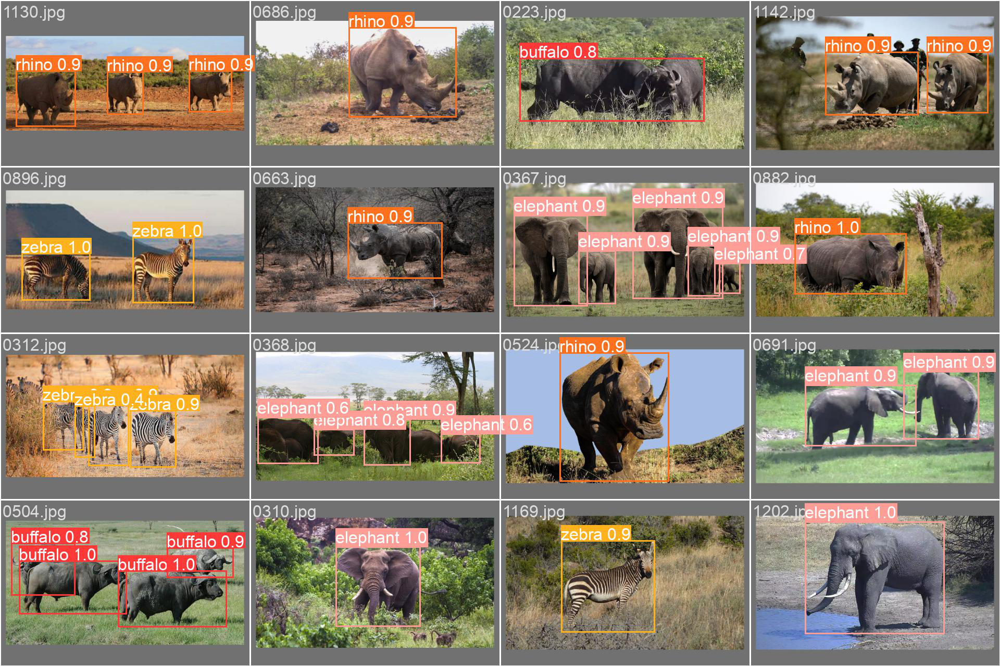

<Figure size 900x900 with 0 Axes>

In [31]:
from PIL import Image
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(9, 9))
train_batch0= Image.open('../python_scripts/yolov5/runs/train/50%_data_50_epochs2/val_batch0_pred.jpg')
train_batch0

# validate
- iou-thres=0.75 

In [19]:
!python ../python_scripts/yolov5/val.py --task "val" --data "../data/Animal Detection/data.yaml" --weights "../models/animal-detection/best_score.pt" --iou-thres 0.75

val: data=../data/Animal Detection/data.yaml, weights=['../models/animal-detection/best_score.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.75, max_det=300, task=val, device=mps, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=../python_scripts/yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.8.16 torch-2.0.1 MPS

Fusing layers... 
YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /Users/tglim/Kaggle/data/Animal Detection/val.cache... 121 images,
val: WARNING ⚠️ ../data/Animal Detection/images/train/1021.jpg: corrupt JPEG restored and saved
                 Class     Images  Instances          P          R      mAP50   
                   all        121        208      0.939       0.92      0.967      0.813
               buffalo        121         38      0.944      0.947      0.966      0.826


# prediction

In [26]:
!python ../python_scripts/yolov5/detect.py --weights "../models/animal-detection/best_score.pt" --source "../data/Animal Detection/images/test"

detect: weights=['../models/animal-detection/best_score.pt'], source=../data/Animal Detection/images/test, data=../python_scripts/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../python_scripts/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-175-g5f11555 Python-3.8.16 torch-2.0.1 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/300 /Users/tglim/Kaggle/data/Animal Detection/images/test/1205.jpg: 448x640 2 elephants, 67.3ms
image 2/300 /Users/tglim/Kaggle/data/Animal Detection/images/test/1206.jpg: 448x640 9 zebras, 60.0ms
image 3/300 /Users/tglim/Kaggle/data/Animal Detection/images/test/1207.jpg: 448x640 1 rhino, 

# visualize test results

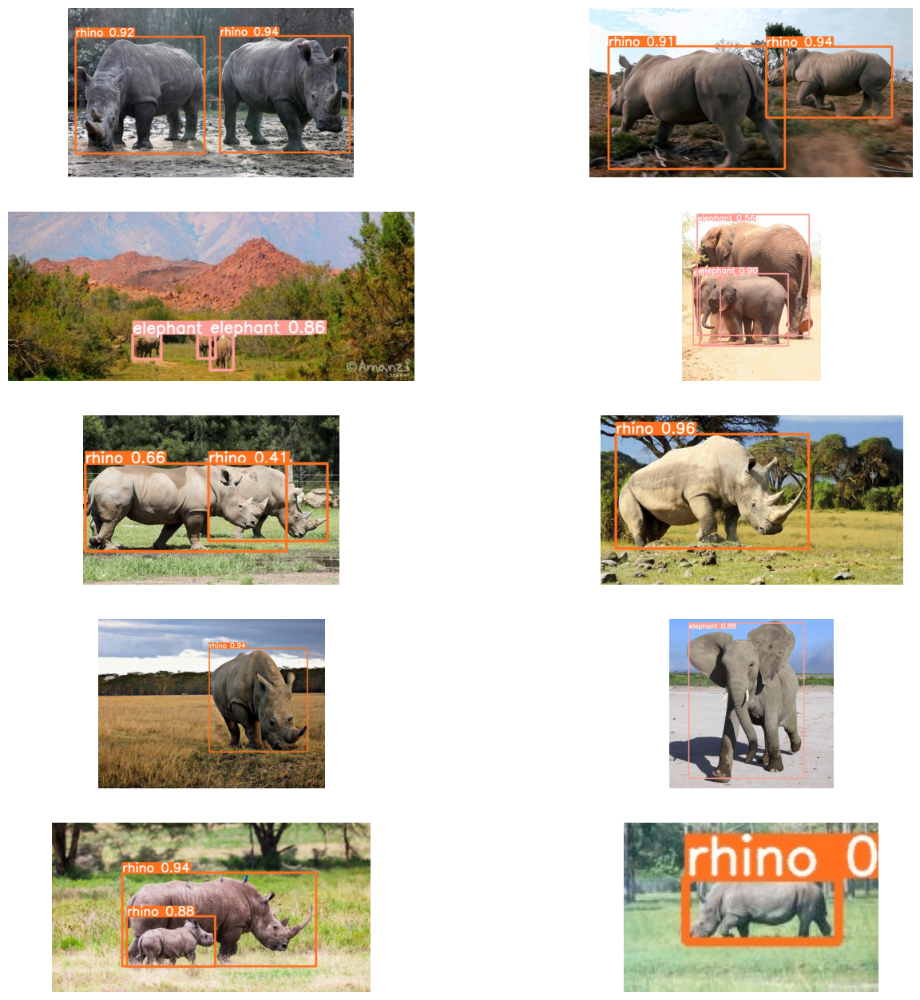

In [29]:
from PIL import Image
import matplotlib.pyplot as plt


detect_dir= Path('../python_scripts/yolov5/runs/detect/exp')

plt.figure(figsize=(16, 16))
detected_img_list = list(detect_dir.glob("*.jpg")) # 모든 이미지 list get

random_detected_img_list =random.sample(detected_img_list, k =10) # 10

for i, results in enumerate(random_detected_img_list):
  plt.subplot(5, 2, i+1)
  results= Image.open(results)
  plt.imshow(results)
  plt.axis("off")